# Image Caption Generator.

- Aluno: Igor Rahzel Colares Galdino
- Matrícula: 2020096255

## Vídeo Explicativo do Notebook

link: https://drive.google.com/file/d/1ocFL4PjSlVjDYKFyChrwl_sjJAits1E1/view?usp=sharing

# Importar Datasets
O dataset utilizado é o Flickr8k, ele possui 8000 imagens, para cada uma delas há 5 descrições possíveis. As imagens foram coletadas de seis diferentes grupos do Flickr, um site de hospedagem de vídeos e imagens. As imagens do dataset tendem a não conter imagens de pessoas ou lugares famosas, elas forma selecionadas manualmente de modo a retratar cenas e situações diversas.

In [ ]:
!mkdir data
!mkdir data/flickr8k
!wget https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_text.zip -O data/flickr8k/Flickr8k_text.zip #Especifica o diretório de saida com o -O
!wget https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip -O data/flickr8k/Flickr8k_Dataset.zip #Especifica o diretório de saida com o -O
!unzip data/flickr8k/Flickr8k_text.zip -d data/flickr8k/
!unzip data/flickr8k/Flickr8k_Dataset.zip -d data/flickr8k/

Streaming output truncated to the last 5000 lines.
  inflating: data/flickr8k/__MACOSX/Flicker8k_Dataset/._342872408_04a2832a1b.jpg  
  inflating: data/flickr8k/Flicker8k_Dataset/3429142249_d09a32e291.jpg  
  inflating: data/flickr8k/__MACOSX/Flicker8k_Dataset/._3429142249_d09a32e291.jpg  
  inflating: data/flickr8k/Flicker8k_Dataset/3429194423_98e911a101.jpg  
  inflating: data/flickr8k/__MACOSX/Flicker8k_Dataset/._3429194423_98e911a101.jpg  
  inflating: data/flickr8k/Flicker8k_Dataset/3429351222_17ae744daf.jpg  
  inflating: data/flickr8k/__MACOSX/Flicker8k_Dataset/._3429351222_17ae744daf.jpg  
  inflating: data/flickr8k/Flicker8k_Dataset/3429351964_531de1bf16.jpg  
  inflating: data/flickr8k/__MACOSX/Flicker8k_Dataset/._3429351964_531de1bf16.jpg  
  inflating: data/flickr8k/Flicker8k_Dataset/3429391520_930b153f94.jpg  
  inflating: data/flickr8k/__MACOSX/Flicker8k_Dataset/._3429391520_930b153f94.jpg  
  inflating: data/flickr8k/Flicker8k_Dataset/3429465163_fb8ac7ce7f.jpg  
  inflat

## Visualizando imagens e legendas do Flickr8k

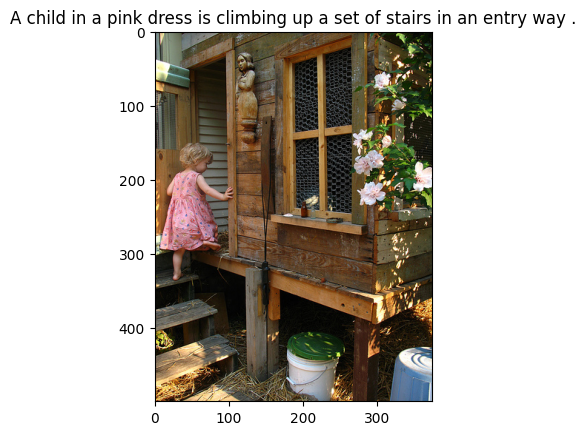

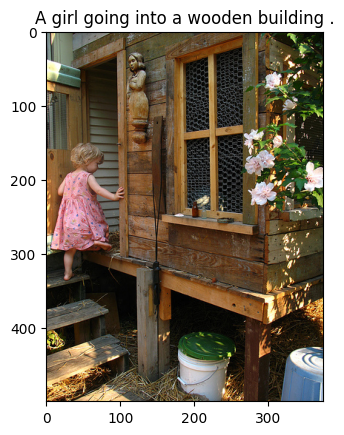

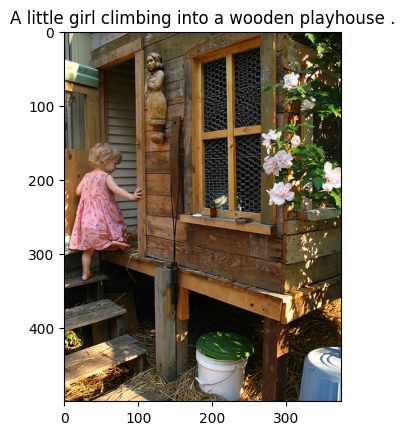

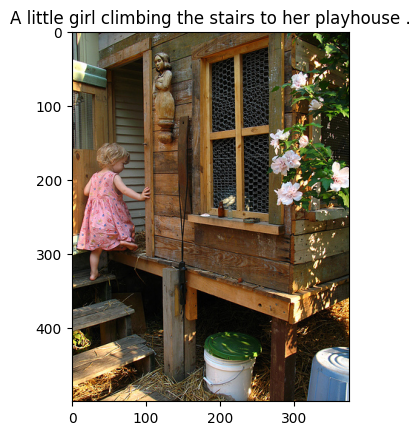

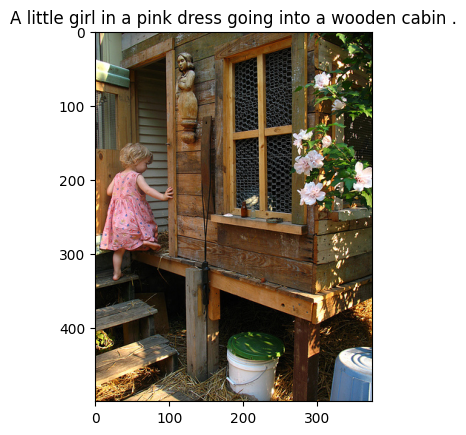

...

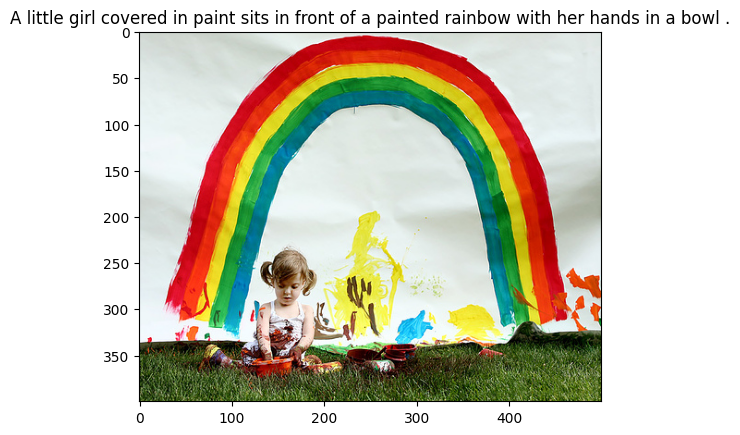

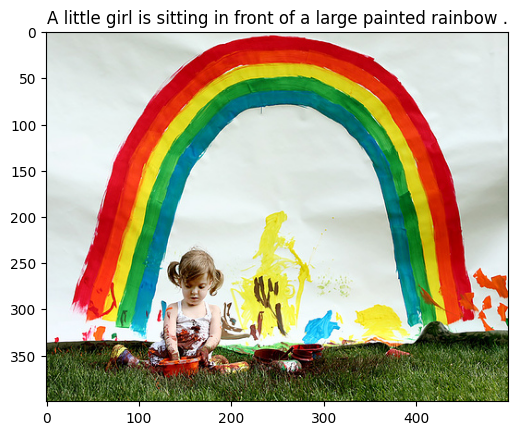

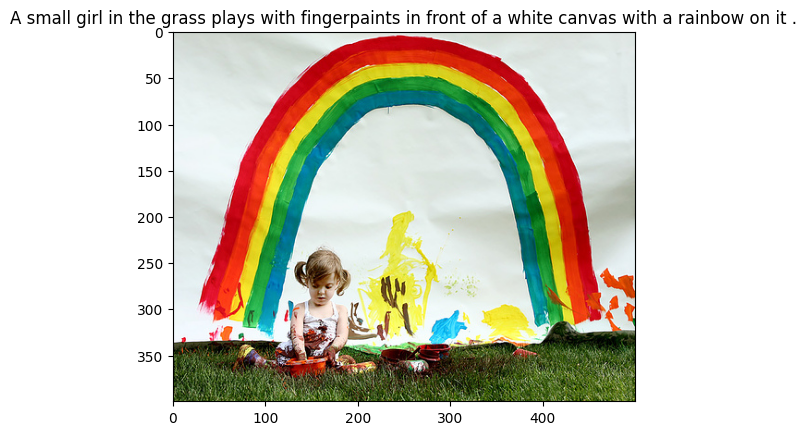

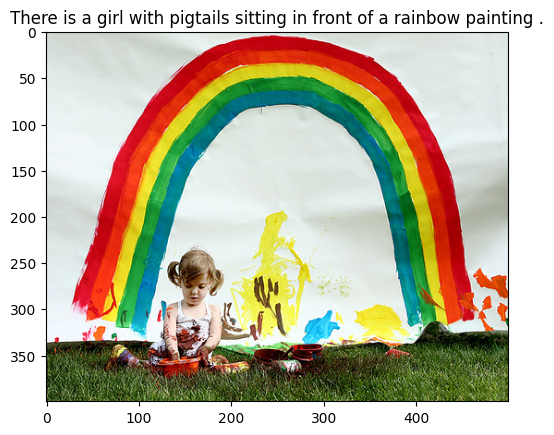

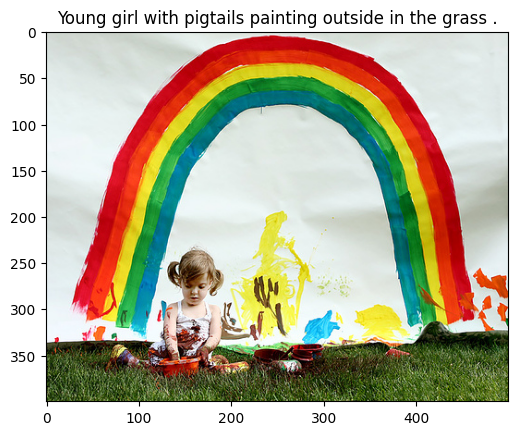

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import PIL
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader

IMAGES_PATH = '/content/data/flickr8k/Flicker8k_Dataset'
CAPTIONS_PATH = '/content/data/flickr8k/Flickr8k.token.txt'

def get_captions(image_id):
  captions = []
  with open(CAPTIONS_PATH, 'r') as file:
    for line in file:
      if line.startswith(image_id):
        caption = line.split('\t')[1].split('\n')[0]
        captions.append(caption)
  return captions

for i,image_name in enumerate(sorted(os.listdir(IMAGES_PATH))):
  captions = get_captions(image_name)
  image_path = os.path.join(IMAGES_PATH, image_name)
  image = PIL.Image.open(image_path)
  for caption in captions:
    plt.imshow(image)
    plt.title(caption)
    plt.show()
  if i == 2:
    break


## Criando Classe Vocabulário

A classe vocabulário é uma classe auxiliar da classe Dataset, e é utilizada para construir um vocabulário com base nas legendas utilizadas pela imagem. Uma palavra só é incluida no vocabulário caso tenhha ocorrência superior ao parâmetro *freq_treshold*, neste trabalho o valor utilizado foi igual a 5, vale ressaltar que todas as palavras são convertidas para minusculas. Além disso é também feito um mapeamento dos tokens para indíces e vice-versa.

In [ ]:
import spacy
spacy_eng = spacy.load("en_core_web_sm")
class Vocabulary:
  def __init__(self, freq_threshold):
    self.freq_threshold = freq_threshold
    self.itos = {0: "<PAD>", 1: "<SOS>", 2: "<EOS>", 3: "<UNK>"}
    self.stoi = {"<PAD>": 0, "<SOS>": 1, "<EOS>": 2, "<UNK>": 3}


  def __len__(self):
    return len(self.itos)

  def tokenizer_en(self, text):
    return [token.text.lower() for token in spacy_eng.tokenizer(text)]

  def build_vocabulary(self, sentence_list):
    frequencies = {}
    idx = 4

    for sentence in sentence_list:
      for word in self.tokenizer_en(sentence):
        if word not in frequencies:
          frequencies[word] = 1
        else:
          frequencies[word] += 1

        if frequencies[word] == self.freq_threshold:
          self.stoi[word] = idx
          self.itos[idx] = word
          idx += 1

  def numericalize(self, text):
    tokenized_text = self.tokenizer_en(text)

    return [
            self.stoi[token] if token in self.stoi else self.stoi["<UNK>"]
            for token in tokenized_text
    ]

## Criando Datasets

A classe *Flickr8kDataset* é utilizada para processar os dados disponibilizados no dataset Flickr8k de modo a deixa-los no formato correto a ser utilizado pelo modelo. Nela é feita a contrução do vocabulário do Dataset utilizando a classe *Vocabulário* implementada previamente, além disso são criadas as listas *images* e *captions* de modo que a i-ésima imagem da lista *images* corresponde a i-ésima legenda da lista *captions*. Além disso antes de retornar as imagens são aplicadas transformações na mesma de modo a adequa-la a entrada da rede, as captions também são processadas de modo a retornar uma lista com os índices correspondentes a cada palavra.

In [ ]:
from torch.utils.data import Dataset

class Flickr8kDataset(Dataset):
  def __init__(self,dir_imgs,images_files_paths, captions_path, transform=None):
    self.images_files_paths = images_files_paths #list of files with the IDs of the images
    self.dir_imgs = dir_imgs
    self.captions_path = captions_path
    self.transform = transform
    self.vocab = Vocabulary(freq_threshold=5)
    self.images,self.captions = self._load_data()
    self.vocab.build_vocabulary(self.captions)


  def _load_data(self):
    images = []
    images_paired_with_captions = []
    captions = []

    # Get all images in .txt files containing the name of the images to be used
    for file_path in self.images_files_paths:
      with open(file_path, 'r') as file:
        for line in file:
          images.append(line.strip())

    # Get the captions corresponding to the selected images
    for image in images:
      with open(self.captions_path, 'r') as file:
        for line in file:
          if line.startswith(image):
            caption = line.strip().split('\t')[1]
            images_paired_with_captions.append(image)
            captions.append(caption)

    return images_paired_with_captions, captions

  def __len__(self):
    return len(self.images)

  def __getitem__(self, idx):
    image_path = os.path.join(self.dir_imgs, self.images[idx])
    image = PIL.Image.open(image_path)
    caption = self.captions[idx]
    numericalized_caption = [self.vocab.stoi["<SOS>"]]
    numericalized_caption += self.vocab.numericalize(caption)
    numericalized_caption.append(self.vocab.stoi["<EOS>"])
    if self.transform:
      image = self.transform(image)
    #print(self.images[idx])
    return image, numericalized_caption

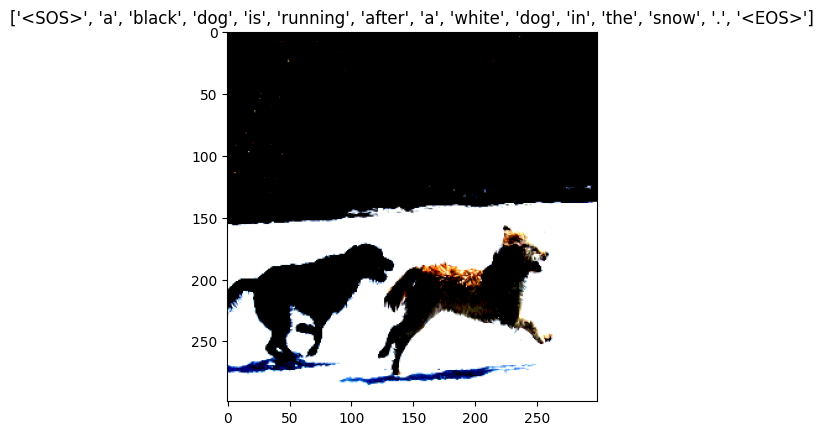

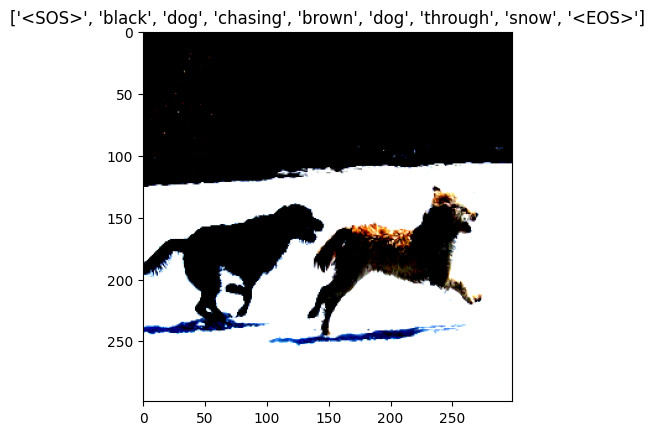

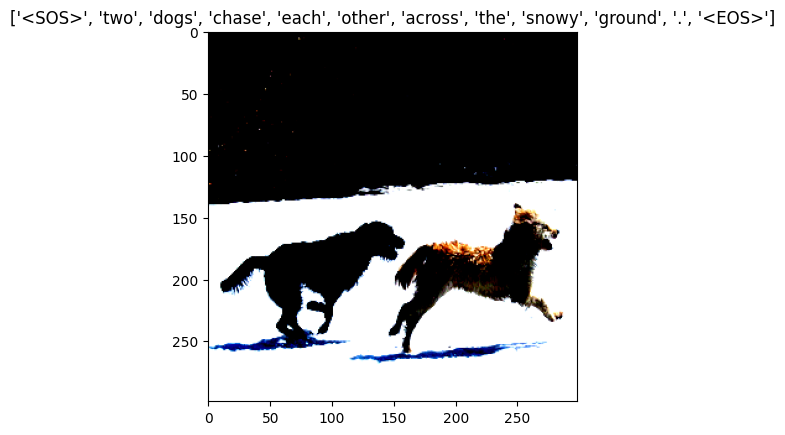

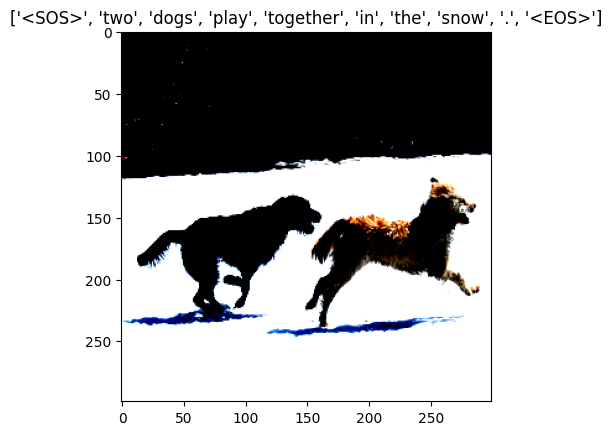

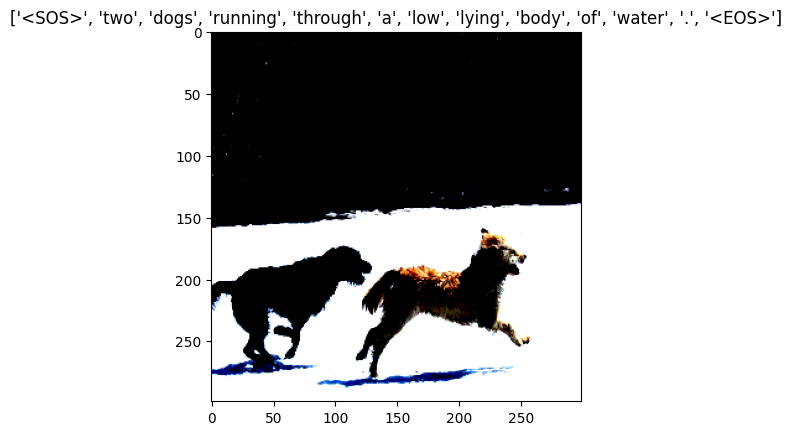

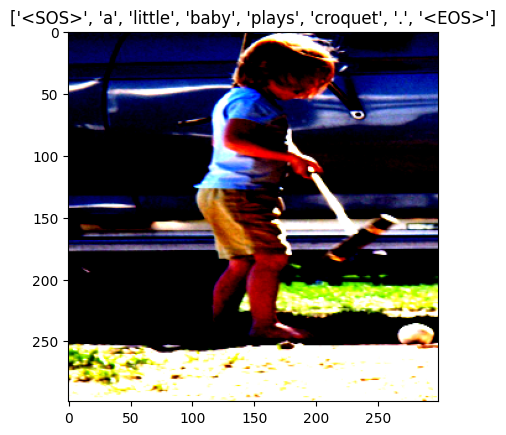

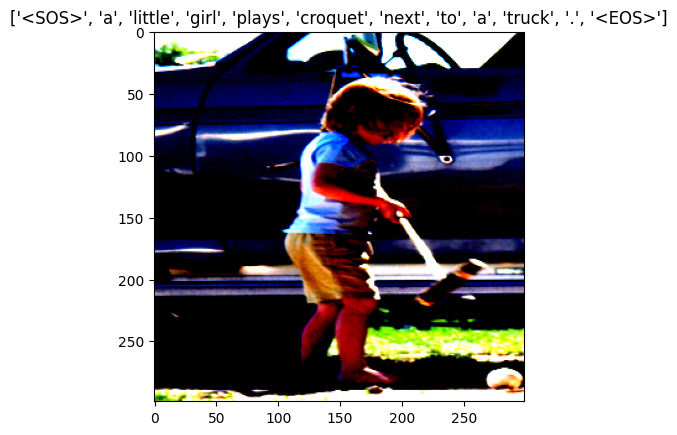

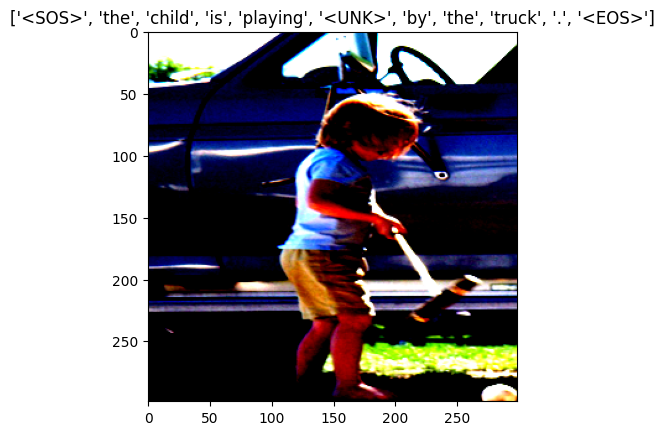

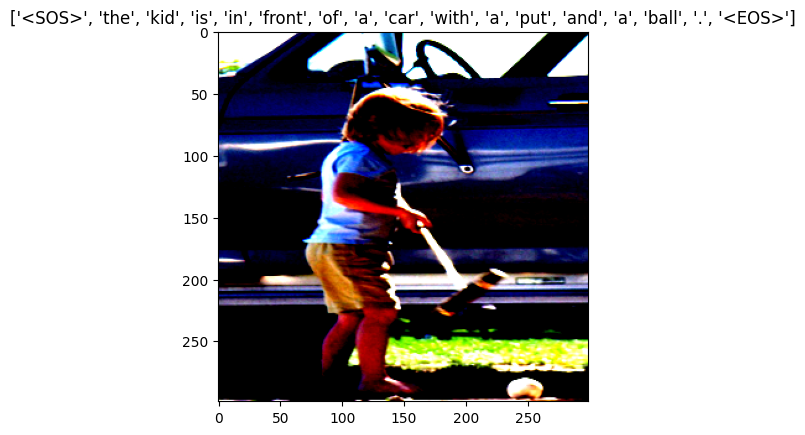

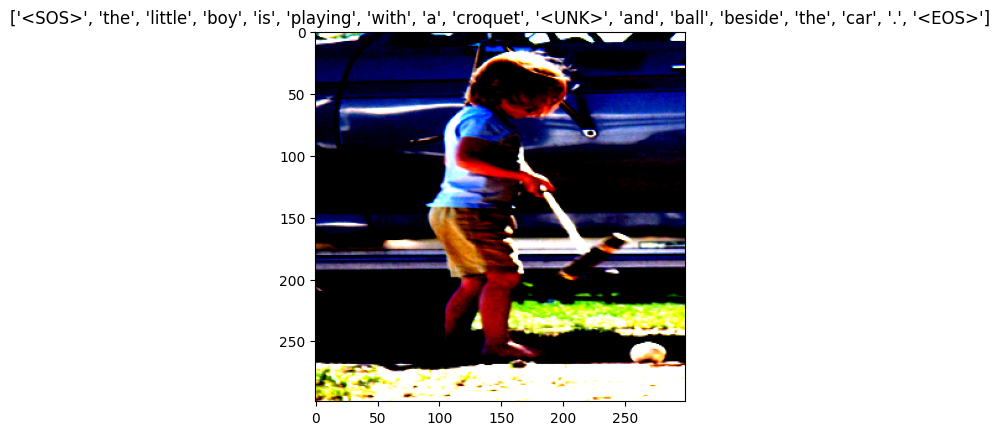

In [ ]:
from torchvision.transforms import transforms
tranform = transforms.Compose([
    transforms.Resize((356, 356)),
    transforms.RandomCrop((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

train_dataset = Flickr8kDataset(dir_imgs=IMAGES_PATH, images_files_paths=['/content/data/flickr8k/Flickr_8k.trainImages.txt'], captions_path=CAPTIONS_PATH, transform=tranform)
for i in range(10):
  image,caption = train_dataset[i]
  plt.imshow(image.permute(1, 2, 0).numpy())  # Se a imagem for um tensor PyTorch
  caption = [train_dataset.vocab.itos[idx] for idx in caption]
  plt.title(caption)
  plt.show()

## Criando Collate Class
Essa classe é utilizada para fazer com que as legendas de um mesmo batch de treinamento possuam o mesmo tamanho, isso é feito por meio da aplicação de padding.

In [ ]:
import torch
from torch.nn.utils.rnn import pad_sequence
class MyCollate:
    def __init__(self, pad_idx):
        self.pad_idx = pad_idx

    def __call__(self, batch):
        # Separar imagens e captions do batch
        images = [item[0].unsqueeze(0) for item in batch]
        images = torch.cat(images, dim=0)
        captions = [item[1] for item in batch]
        captions = pad_sequence([torch.tensor(cap) for cap in captions], batch_first=False, padding_value=self.pad_idx)

        return images, captions

## Criando DataLoader

O DataLoader é utilizado para carregar as imagens de forma eficiente durante o loop de treinamento do modelo.

In [ ]:
from torch.utils.data import DataLoader

train_dataloader = DataLoader(train_dataset,batch_size=32,shuffle=True,collate_fn=MyCollate(pad_idx=train_dataset.vocab.stoi["<PAD>"]))


In [ ]:
# Example of dataloader return
for images, captions in train_dataloader:
  print(images.shape)
  print(captions.shape)
  break

torch.Size([32, 3, 299, 299])
torch.Size([21, 32])


## Criando modelo

O modelo utilizado para a tarefa de Image Captioning consiste em uma CNN, da qual se extraí o *feature vector* da última camada conectada, e uma RNN que recebe esse *feature vector* como entrada e tenta decodifica-lo de modo a gerar uma legenda. Dessa forma a CNN atua como um encoder para a image e a RNN como um decoder. Abaixo é mostrada a arquitetura utilizada.

![Modelo](https://raw.githubusercontent.com/yunjey/pytorch-tutorial/master/tutorials/03-advanced/image_captioning/png/model.png)


Observe que a RNN é composta por células LSTM(Long Short Term Memory). É importante pontuar que durante o treinamento foi utilizada a estratégia de *Teacher Reinforcement Learning*, ou seja, a saída anterior da rede não é utilizada como a entrada do próximo passo, mas sim a saída ground-truth esperada.



In [ ]:
import torch.nn as nn
class EncoderCNN(nn.Module):
    def __init__(self, embed_size, train_CNN=False):
      super(EncoderCNN, self).__init__()
      self.train_CNN = train_CNN
      self.inception = torchvision.models.inception_v3(pretrained=True, aux_logits=True)
      self.inception.fc = nn.Linear(self.inception.fc.in_features, embed_size)
      self.relu = nn.ReLU()
      self.dropout = nn.Dropout(0.5)

    def forward(self, images):
      # Obtém a saída principal (ignora a saída auxiliar)
      features = self.inception(images)
      if isinstance(features, tuple):  # Checa se existem múltiplas saídas
          features = features[0]  # Apenas a saída principal é usada
      for name, param in self.inception.named_parameters():
          if "fc.weight" in name or "fc.bias" in name:
              param.requires_grad = True
          else:
              param.requires_grad = self.train_CNN

      return self.dropout(self.relu(features))



In [ ]:
class DecoderRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers):
        super(DecoderRNN, self).__init__()
        self.embed = nn.Embedding(vocab_size, embed_size)
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers)
        self.linear = nn.Linear(hidden_size, vocab_size)
        self.dropout = nn.Dropout(0.5)

    def forward(self, features, captions):
        embeddings = self.dropout(self.embed(captions))
        embeddings = torch.cat((features.unsqueeze(0), embeddings), dim=0)
        hiddens, _ = self.lstm(embeddings)
        outputs = self.linear(hiddens)
        return outputs


In [ ]:
class CNNtoRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers):
        super(CNNtoRNN, self).__init__()
        self.encoderCNN = EncoderCNN(embed_size)
        self.decoderRNN = DecoderRNN(embed_size, hidden_size, vocab_size, num_layers)

    def forward(self, images, captions):
        features = self.encoderCNN(images)
        outputs = self.decoderRNN(features, captions)
        return outputs

    def caption_image(self, image, vocabulary, max_length=50):
      result_caption = []

      with torch.no_grad():
        x = self.encoderCNN(image).unsqueeze(0)
        states = None

        for _ in range(max_length):
          hiddens, states = self.decoderRNN.lstm(x, states)
          output = self.decoderRNN.linear(hiddens.squeeze(0))
          predicted = output.argmax(1)

          result_caption.append(predicted.item())
          x = self.decoderRNN.embed(predicted).unsqueeze(0)

          if vocabulary.itos[predicted.item()] == "<EOS>":
              break


      return [vocabulary.itos[idx] for idx in result_caption]


## Treinando Modelo

### Hiperparâmetros


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
embed_size = 256
hidden_size = 256
vocab_size = len(train_dataset.vocab)
num_layers = 1
learning_rate = 3e-4
num_epochs = 100
model = CNNtoRNN(embed_size, hidden_size, vocab_size, num_layers).to(device)
criterion = nn.CrossEntropyLoss(ignore_index=train_dataset.vocab.stoi["<PAD>"])
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
model.load_state_dict(torch.load('/content/drive/MyDrive/modelsNLP/model_epoch_140.pth'))

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
<ipython-input-25-9c7f1a67e1e6>:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for mo

<All keys matched successfully>

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')  # Mount Google Drive
#os.makedirs('/content/drive/MyDrive/modelsNLP', exist_ok=True)  # Create the directory in Google Drive if it doesn't exist
#save_path = '/content/drive/MyDrive/modelsNLP/'  # Define save path in Drive

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-19-fd400fb756a0>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"{save_path}model_epoch_110.pth"))


<All keys matched successfully>

**NÃO EXECUTAR CÉLULA ABAIXO** --- **NÃO EXECUTAR CÉLULA ABAIXO** --- **NÃO EXECUTAR CÉLULA ABAIXO** --- **NÃO EXECUTAR CÉLULA ABAIXO**

Epoch 1/30 completed - Average Loss: 1.7608


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_111.pth
Real caption: <SOS> the number 2 dog in the blue vest is in the lead at the dog races . <EOS>
Predicted caption: <SOS> a horse and rider are clearing a bend in the circuit . <EOS>


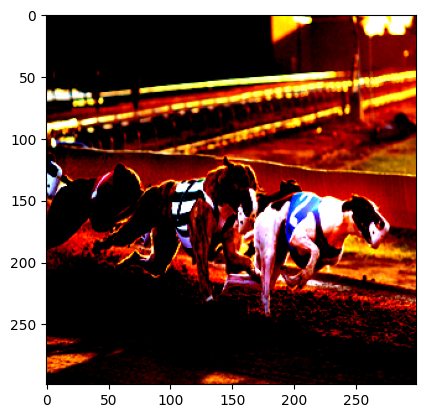

Epoch 2/30 completed - Average Loss: 1.7588


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_112.pth
Real caption: <SOS> two guys wearing jackets . <EOS>
Predicted caption: <SOS> a man in a black shirt and a woman in a white shirt are looking at the camera . <EOS>


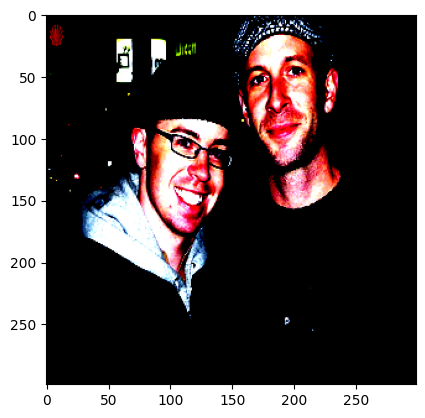

Epoch 3/30 completed - Average Loss: 1.7546


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_113.pth
Real caption: <SOS> a young female firefighter stands in front of a crowd . <EOS>
Predicted caption: <SOS> a woman with a mohawk is wearing sunglasses and a white top . <EOS>


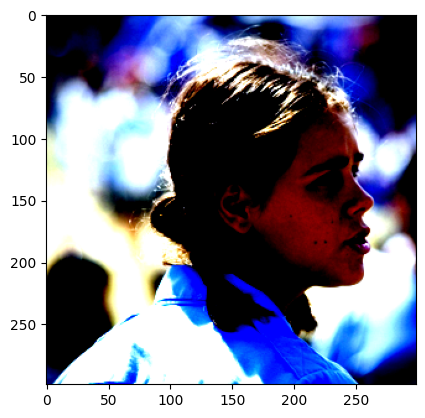

Epoch 4/30 completed - Average Loss: 1.7539


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_114.pth
Real caption: <SOS> a man and a woman are strapped into a circular metal ride . <EOS>
Predicted caption: <SOS> a man in a blue shirt and jeans is riding a bike on a dirt path . <EOS>


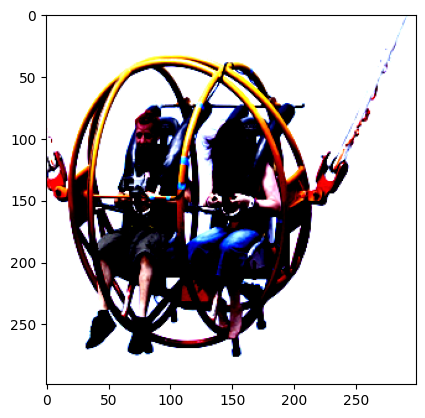

Epoch 5/30 completed - Average Loss: 1.7500


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_115.pth
Real caption: <SOS> a man looks out at the water under a bridge and against a skyline . <EOS>
Predicted caption: <SOS> a man sits on a bench in front of a building . <EOS>


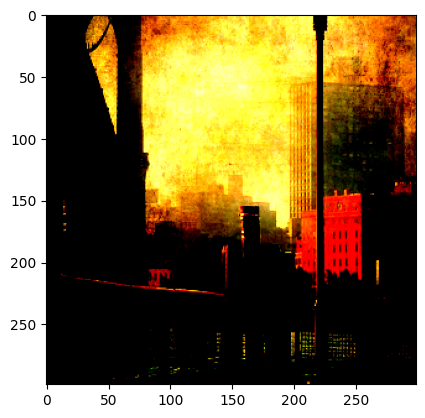

Epoch 6/30 completed - Average Loss: 1.7478


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_116.pth
Real caption: <SOS> an african family are standing in front of some makeshift houses . <EOS>
Predicted caption: <SOS> a group of people are standing in a line on a field of grass and <UNK> . <EOS>


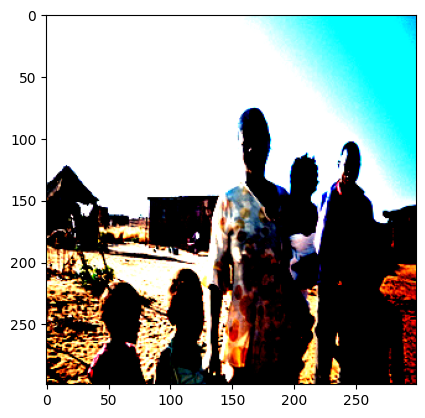

Epoch 7/30 completed - Average Loss: 1.7443


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_117.pth
Real caption: <SOS> two people <UNK> in a doorway and they are both wearing jeans . <EOS>
Predicted caption: <SOS> a man in a blue shirt and jeans stands in front of a brick wall . <EOS>


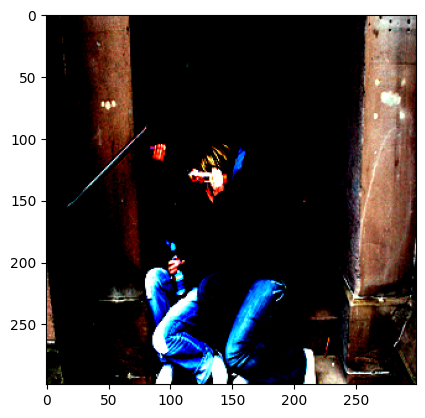

Epoch 8/30 completed - Average Loss: 1.7423


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_118.pth
Real caption: <SOS> a boy does a skateboard jump at a skateboard park . <EOS>
Predicted caption: <SOS> a young girl wearing a pink shirt swings on a swing . <EOS>


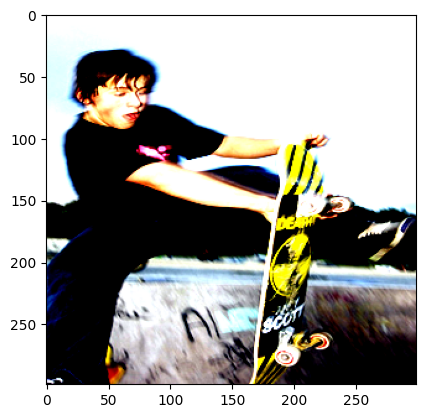

Epoch 9/30 completed - Average Loss: 1.7396


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_119.pth
Real caption: <SOS> a man sits on a rock . <EOS>
Predicted caption: <SOS> a man is standing on top of a mountain overlooking the mountains . <EOS>


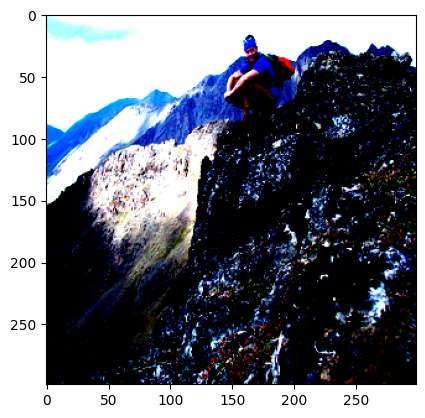

Epoch 10/30 completed - Average Loss: 1.7384


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_120.pth
Real caption: <SOS> two people in red outfits riding their bicycles down a dirt road . <EOS>
Predicted caption: <SOS> a man is standing on top of a mountain . <EOS>


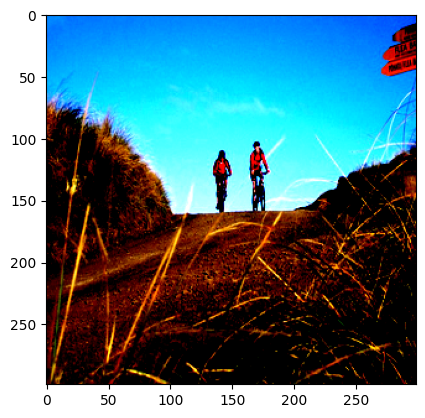

Epoch 11/30 completed - Average Loss: 1.7362


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_121.pth
Real caption: <SOS> five boys in the middle of the air about to jump into the pond . <EOS>
Predicted caption: <SOS> a group of children are playing on a round swing . <EOS>


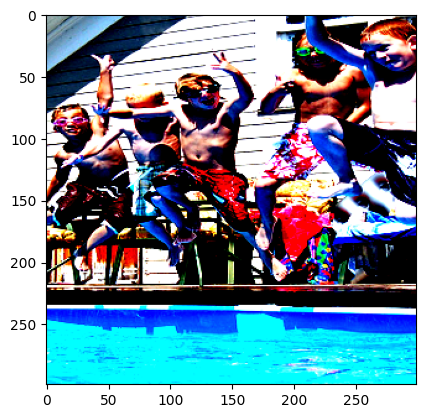

Epoch 12/30 completed - Average Loss: 1.7335


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_122.pth
Real caption: <SOS> a group of <UNK> are walking in the city . <EOS>
Predicted caption: <SOS> a group of people are standing in front of a large building . <EOS>


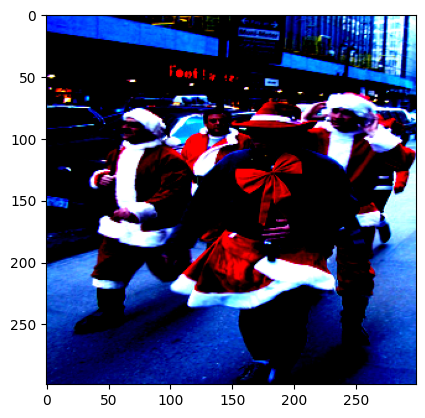

Epoch 13/30 completed - Average Loss: 1.7316


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_123.pth
Real caption: <SOS> the boy in the red jersey runs with the football . <EOS>
Predicted caption: <SOS> a football player in a red uniform is tackling the player in red . <EOS>


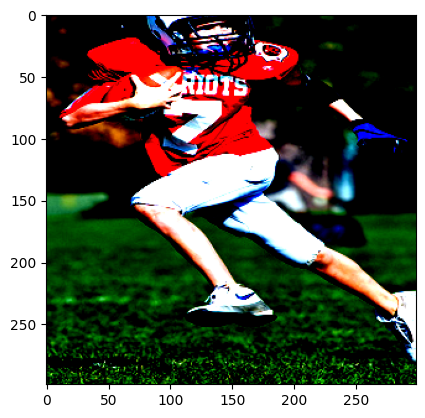

Epoch 14/30 completed - Average Loss: 1.7282


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_124.pth
Real caption: <SOS> boys jump off a bridge into the water . <EOS>
Predicted caption: <SOS> a young boy in a swimsuit is playing in the water . <EOS>


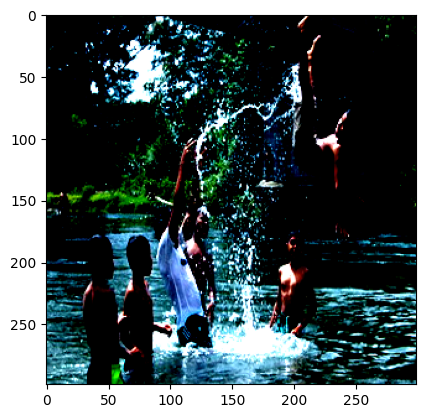

Epoch 15/30 completed - Average Loss: 1.7274


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_125.pth
Real caption: <SOS> the girl wearing the straw hat is sitting on the concrete steps . <EOS>
Predicted caption: <SOS> a woman in a red shirt is sitting on a bench with a towel in her hand . <EOS>


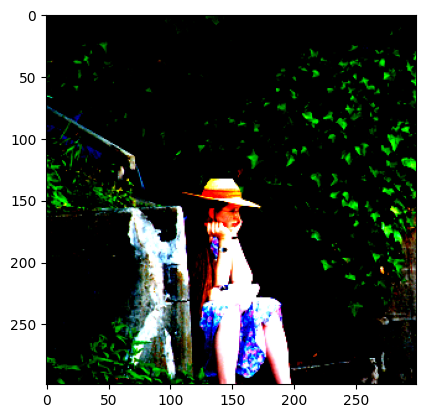

Epoch 16/30 completed - Average Loss: 1.7234


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_126.pth
Real caption: <SOS> a cyclist <UNK> blue and white is leading a pack of cyclists . <EOS>
Predicted caption: <SOS> a group of people ride bicycles through a marathon . <EOS>


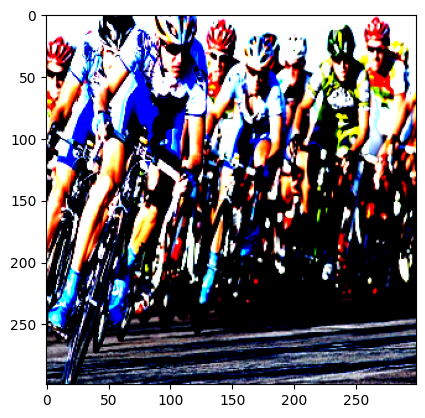

Epoch 17/30 completed - Average Loss: 1.7224


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_127.pth
Real caption: <SOS> a brown and black dog is standing on its hind legs trying to catch something . <EOS>
Predicted caption: <SOS> a dog is running through the grass . <EOS>


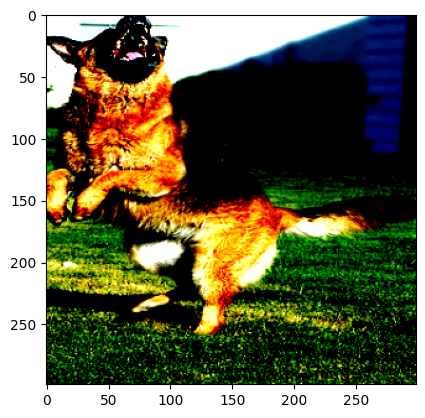

Epoch 18/30 completed - Average Loss: 1.7209


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_128.pth
Real caption: <SOS> a man with red pants is skiing downhill . <EOS>
Predicted caption: <SOS> a snowboarder is doing a jump on a snowboard . <EOS>


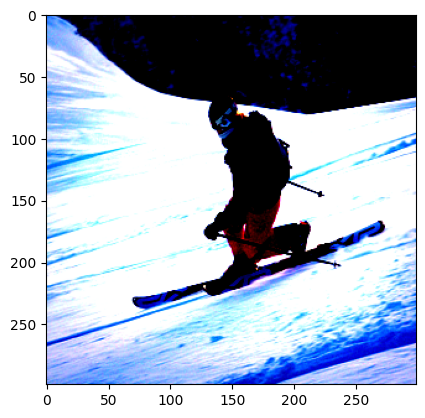

Epoch 19/30 completed - Average Loss: 1.7187


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_129.pth
Real caption: <SOS> a woman in boots with a big purse walks down the street followed by a woman in blue . <EOS>
Predicted caption: <SOS> a woman in a white shirt and jeans is talking to a man in a red jacket . <EOS>


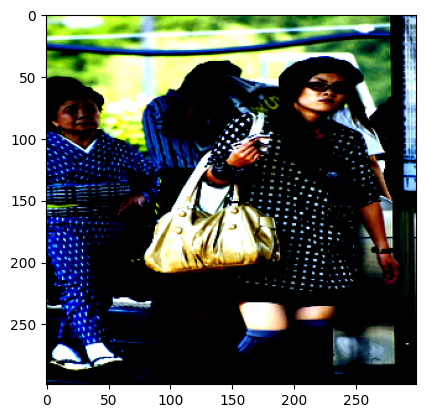

Epoch 20/30 completed - Average Loss: 1.7144


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_130.pth
Real caption: <SOS> a brown dog is splashing in a puddle in the grass . <EOS>
Predicted caption: <SOS> a brown dog is running through a grassy field . <EOS>


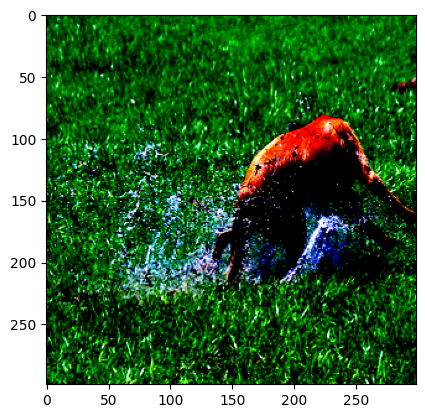

Epoch 21/30 completed - Average Loss: 1.7129


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_131.pth
Real caption: <SOS> several men riding <UNK> through the street . <EOS>
Predicted caption: <SOS> a group of people are standing in a line on a street . <EOS>


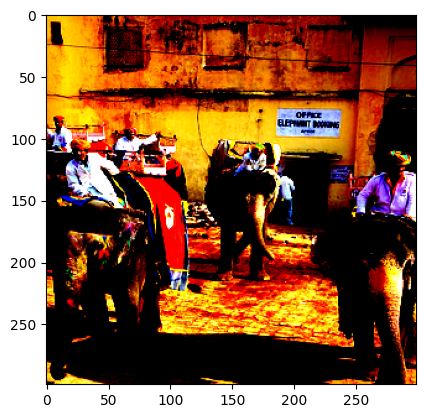

Epoch 22/30 completed - Average Loss: 1.7130


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_132.pth
Real caption: <SOS> a small white dog is jumping over a branch on the ground covered with leaves . <EOS>
Predicted caption: <SOS> a white dog is running through the grass . <EOS>


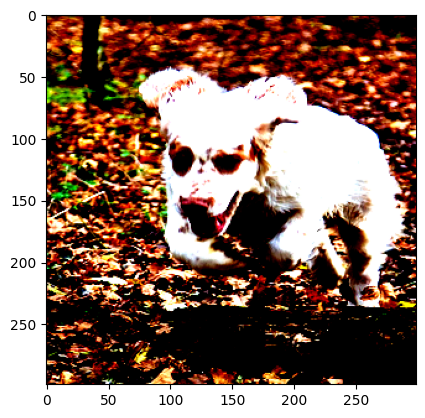

Epoch 23/30 completed - Average Loss: 1.7087


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_133.pth
Real caption: <SOS> baseball player looking out into a stadium crowd <EOS>
Predicted caption: <SOS> a football player in a red uniform is tackling the player in red . <EOS>


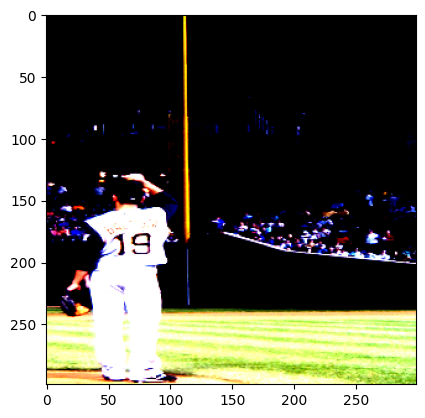

Epoch 24/30 completed - Average Loss: 1.7077


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_134.pth
Real caption: <SOS> a four wheel drive car is <UNK> along a rocky off road trail . <EOS>
Predicted caption: <SOS> a jeep stuck in the mud . <EOS>


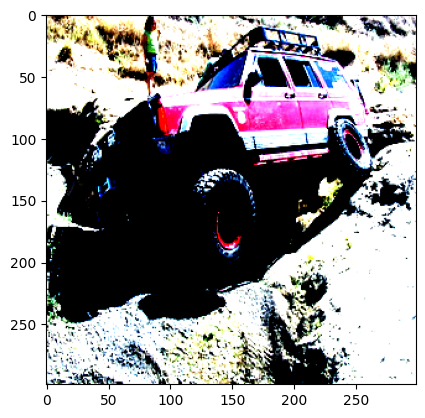

Epoch 25/30 completed - Average Loss: 1.7060


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_135.pth
Real caption: <SOS> a person is in <UNK> water and holding onto a rope . <EOS>
Predicted caption: <SOS> a boy in a blue shirt is splashing in the water . <EOS>


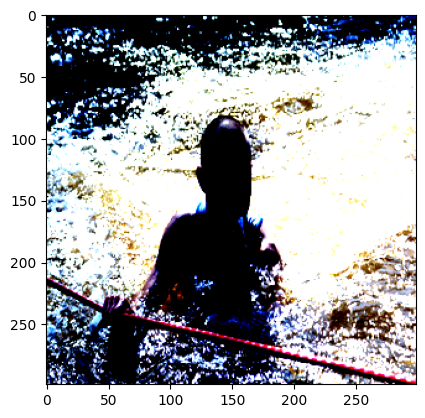

Epoch 26/30 completed - Average Loss: 1.7026


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_136.pth
Real caption: <SOS> an <UNK> stands on a rock at the edge of a river . <EOS>
Predicted caption: <SOS> a man is standing on top of a rock with a mountain in the background . <EOS>


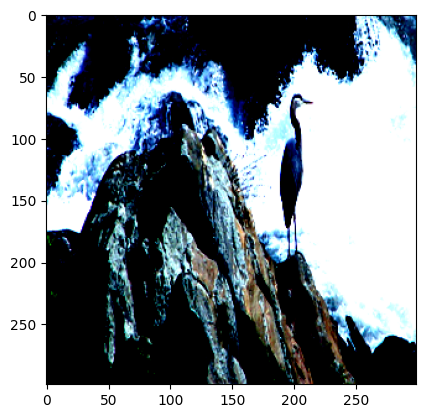

Epoch 27/30 completed - Average Loss: 1.7012


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_137.pth
Real caption: <SOS> the leashed dog jumps high to catch the old soccer ball . <EOS>
Predicted caption: <SOS> a black dog is running through the grass . <EOS>


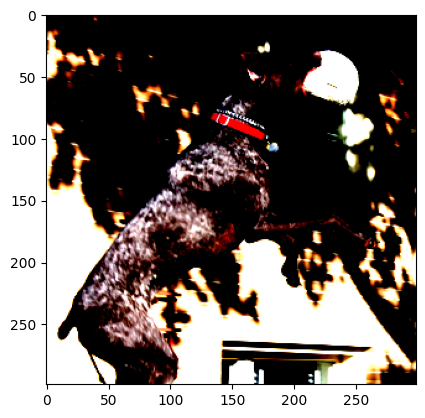

Epoch 28/30 completed - Average Loss: 1.6996


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_138.pth
Real caption: <SOS> two male basketball players are fighting over a basketball . <EOS>
Predicted caption: <SOS> a basketball player in a red uniform is dribbling the ball . <EOS>


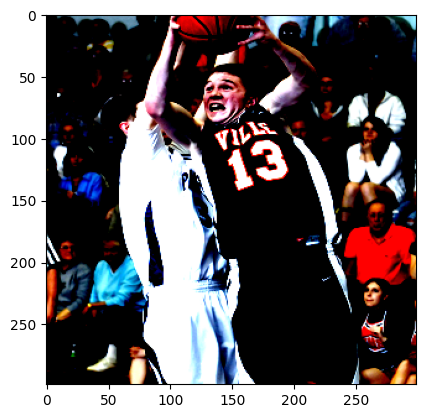

Epoch 29/30 completed - Average Loss: 1.6975


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_139.pth
Real caption: <SOS> a girl throws stones and watches the lake splash . <EOS>
Predicted caption: <SOS> a young girl in a bathing suit leaps into the pool . <EOS>


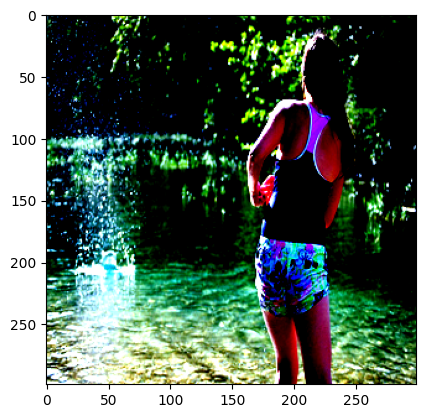

Epoch 30/30 completed - Average Loss: 1.6963


Model saved: /content/drive/MyDrive/modelsNLP/model_epoch_140.pth
Real caption: <SOS> the two men look at the shoreline from atop the <UNK> . <EOS>
Predicted caption: <SOS> a man and a dog are standing on a beach . <EOS>


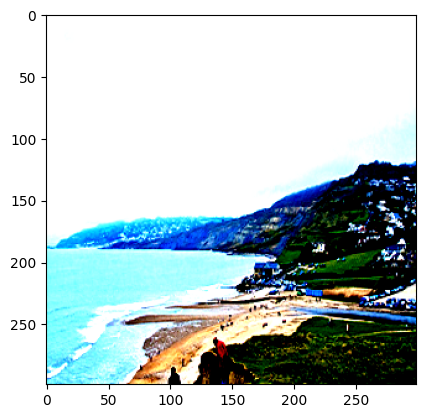

In [ ]:
def train_model(model, train_loader, dataset, criterion, optimizer, num_epochs, batch_size=32,start_epoch = 0):

    model.train()
    total_batches = len(train_loader)
    loss_list = []

    for epoch in range(num_epochs):
        epoch_loss = 0
        model.train()

        for i, (images, captions) in enumerate(train_loader):
            images = images.to(device)
            captions = captions.to(device)

            # Forward pass
            outputs = model(images, captions[:-1])
            loss = criterion(outputs.reshape(-1, outputs.shape[2]), captions.reshape(-1))
            epoch_loss += loss.item()

            # Backpropagation and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # Calculate average loss for the epoch
        average_loss = epoch_loss / total_batches
        print(f"Epoch {epoch + 1}/{num_epochs} completed - Average Loss: {average_loss:.4f}")
        loss_list.append(average_loss)

        # Save the model to Google Drive
        torch.save(model.state_dict(), f"{save_path}model_epoch_{start_epoch+epoch+1}.pth")
        print(f"Model saved: {save_path}model_epoch_{start_epoch + epoch+1}.pth")

        # Show a sample prediction for the epoch
        idx = np.random.randint(0, len(dataset))
        image, correct_caption = dataset[idx]
        correct_caption = [dataset.vocab.itos[idx] for idx in correct_caption]
        correct_caption = " ".join(correct_caption)
        model.eval()
        predicted_caption = model.caption_image(image.unsqueeze(0).to(device), dataset.vocab)
        plt.imshow(image.permute(1, 2, 0).cpu().numpy())
        print(f'Real caption: {correct_caption}')
        print(f'Predicted caption: {" ".join(predicted_caption)}')
        plt.show()

    return loss_list

num_epochs = 30
loss_list = train_model(model, train_dataloader, train_dataset, criterion, optimizer, num_epochs, batch_size=32,start_epoch=110)

##Teste do modelo

In [ ]:
TEST_IMAGES_PATH = "/content/data/flickr8k/Flickr_8k.testImages.txt"
ALL_IMAGES_PATH = "/content/data/flickr8k/Flicker8k_Dataset"
TEST_IMAGES_NAME = []

CAPTIONS_PATH = "/content/data/flickr8k/Flickr8k.token.txt"
CAPTIONS = []

with open(TEST_IMAGES_PATH, 'r') as file:
  for line in file:
    TEST_IMAGES_NAME.append(line.strip())

for image_name in TEST_IMAGES_NAME:
  with open(CAPTIONS_PATH, 'r') as file:
    for line in file:
      if line.startswith(image_name):
        caption = line.strip().split('\t')[1]
        CAPTIONS.append((image_name,caption))

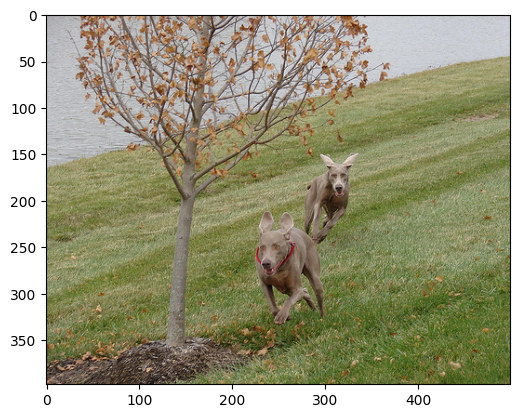

Predicted caption: <SOS> two dogs are running through a field . <EOS>
Real caption: Two dogs run along the green grass near the water .
Real caption: Two dogs running past a tree .
Real caption: Two dogs run through a field .
Real caption: Two dogs run through grass near a body of water .
Real caption: Two grey dogs run near the water on a manicured lawn in the fall .


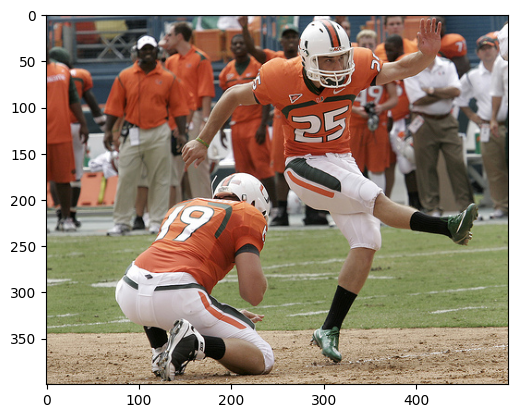

Predicted caption: <SOS> a football player in a red jersey is running with the ball . <EOS>
Real caption: A holder and kicker for a football team dressed in orange , white and black play while onlookers behind them watch .
Real caption: A kicker launches the football forward while the holder checks his fingers .
Real caption: The football player wearing a white helmet and orange chairs swing his leg while the player next to him kneels .
Real caption: Two football player are in the kick off position in front of a crowd .
Real caption: Two young men on the same football team are wearing orange and white uniforms and playing on an outside field while coaches and other players watch .


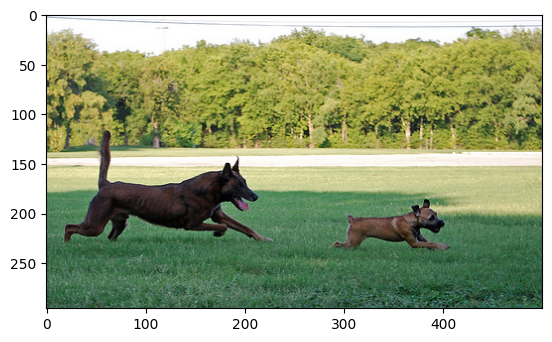

Predicted caption: <SOS> a dog runs through the grass . <EOS>
Real caption: A big dog chases a little dog on the grass .
Real caption: A black dog is chasing a smaller brown dog over grass .
Real caption: The large brown dog is chasing after the little brown dog .
Real caption: Two brown dogs run through the grass together .
Real caption: two dogs play in the grass .


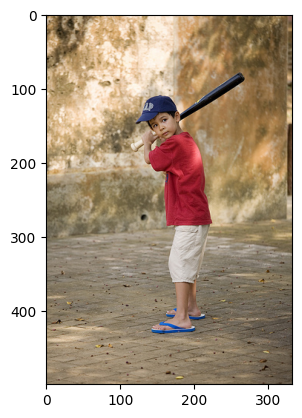

Predicted caption: <SOS> a boy in a blue shirt is running through a field . <EOS>
Real caption: A little boy holds a bat waiting for the pitch on a tiled outdoor area wearing a red shirt , white shorts , and blue flip flops that are too big for him .
Real caption: A little boy playing baseball outside wearing flip flops .
Real caption: A little boy preparing to hit a baseball
Real caption: a small boy wearing a red shirt swinging a baseball bat
Real caption: A young boy gets ready to swing his baseball bat .


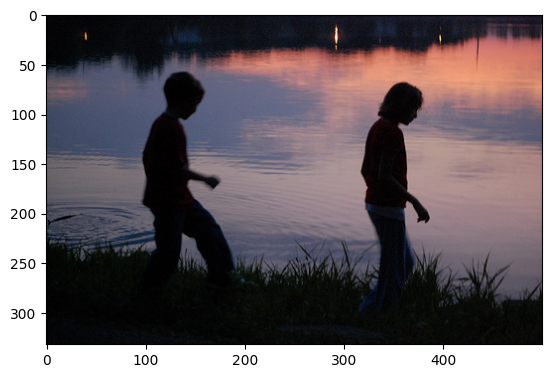

Predicted caption: <SOS> two people stand on a dock looking out at the ocean . <EOS>
Real caption: A boy and a girl are standing on the edge of a lake at sunset .
Real caption: Two children are walking by a pond
Real caption: Two figures are walking by a pond .
Real caption: Two people are silhouetted against a lake reflecting a painted sky .
Real caption: Two people silhouetted against a lake at sunset .


In [ ]:
def inference(num_images = 5):
  idx = np.random.randint(0, len(TEST_IMAGES_NAME),num_images)
  model.eval()
  with torch.no_grad():
    for i in idx:
      image_path = os.path.join(ALL_IMAGES_PATH, TEST_IMAGES_NAME[i])
      image = PIL.Image.open(image_path)
      plt.imshow(image)
      plt.show()
      image = tranform(image)
      predicted_caption = model.caption_image(image.unsqueeze(0).to(device), train_dataset.vocab)
      print(f'Predicted caption: {" ".join(predicted_caption)}')
      for caption in CAPTIONS:
        if caption[0] == TEST_IMAGES_NAME[i]:
          print(f'Real caption: {caption[1]}')


inference()

